# 모델 학습 실험 3
노이즈 주입에 따른 드리프트 분석 및 모델 추론 성능 비교<br>
* ref : 원본 이미지
* cur : ref + 일정 수준의 노이즈
* test : ref + 무작위 수준의 노이즈


## 데이터 준비
데이터셋 노이즈 주입 및 복제

### 전체 데이터 형상

In [29]:
import os

print(os.getcwd())

/home/ethicsense/dev/datadrift_app_engine/notebooks


In [30]:
import os

data_dir = "../datasets"
files = os.listdir(data_dir)

for file in files:
    print(file)


tunelpdr_merged_all.zip
tunelpdr_merged_all


In [31]:
data_path = os.path.join(data_dir, files[1])
print(data_path)

../datasets/tunelpdr_merged_all


In [32]:
os.listdir(data_path)

['images', 'labels', 'dataset.yaml']

In [33]:
img_path = os.path.join(data_path, "images")
os.listdir(img_path)

['train', 'val']

In [34]:
total_files = 0

for subdir in ['train', 'val']:
    subdir_path = os.path.join(img_path, subdir)
    files_count = len(os.listdir(subdir_path))
    print(f'{subdir} 디렉터리 파일 갯수: {files_count}')
    total_files += files_count

print(f"전체 파일 갯수 : {total_files}")

train 디렉터리 파일 갯수: 10233
val 디렉터리 파일 갯수: 2558
전체 파일 갯수 : 12791


### 노이즈 주입 함수

In [35]:
import cv2
import numpy as np

def add_noise(image, noise_type='gaussian', params=None):
    """
    다양한 종류의 노이즈를 추가하는 함수
    
    noise_type 옵션:
    - gaussian: 가우시안 노이즈
    - salt_and_pepper: 소금-후추 노이즈
    - poisson: 포아송 노이즈
    - speckle: 스펙클 노이즈
    - periodic: 주기적 노이즈
    - motion_blur: 모션 블러
    - jpeg_compression: JPEG 압축 노이즈
    - brightness_contrast: 밝기와 대비 조정
    """
    if params is None:
        params = {}
    
    noisy = np.copy(image)
    
    if noise_type == "gaussian":
        # 가우시안 노이즈: 정규 분포를 따르는 랜덤 노이즈
        mean = params.get('mean', 0)
        sigma = params.get('sigma', 25)
        gauss = np.random.normal(mean, sigma, image.shape)
        noisy = np.clip(image + gauss, 0, 255).astype(np.uint8)
    
    elif noise_type == "salt_and_pepper":
        # 소금-후추 노이즈: 랜덤하게 흰점과 검은점을 추가
        prob = params.get('prob', 0.05)
        rnd = np.random.random(image.shape)
        noisy[rnd < prob/2] = 0    # 후추 노이즈
        noisy[rnd > 1 - prob/2] = 255  # 소금 노이즈
    
    elif noise_type == "poisson":
        # 포아송 노이즈: 이미지 센서에서 발생하는 노이즈
        vals = len(np.unique(image))
        vals = 2 ** np.ceil(np.log2(vals))
        noisy = np.random.poisson(image * vals) / float(vals)
        noisy = np.clip(noisy, 0, 255).astype(np.uint8)
    
    elif noise_type == "speckle":
        # 스펙클 노이즈: 레이더나 초음파 이미지에서 발생하는 노이즈
        intensity = params.get('intensity', 0.1)
        gauss = np.random.normal(0, intensity, image.shape)
        noisy = np.clip(image + image * gauss, 0, 255).astype(np.uint8)
    
    elif noise_type == "periodic":
        # 주기적 노이즈: 전기적 간섭이나 센서 문제로 발생하는 주기적 패턴
        freq = params.get('freq', 0.1)
        x, y = np.meshgrid(np.arange(image.shape[1]), np.arange(image.shape[0]))
        noise = 20 * np.sin(2 * np.pi * freq * x) + 20 * np.sin(2 * np.pi * freq * y)
        noisy = np.clip(image + noise[:, :, np.newaxis], 0, 255).astype(np.uint8)
    
    elif noise_type == "motion_blur":
        # 모션 블러: 카메라나 피사체의 움직임으로 인한 블러
        size = params.get('size', 15)
        angle = params.get('angle', 45)
        kernel = np.zeros((size, size))
        kernel[int((size-1)/2), :] = np.ones(size)
        kernel = cv2.warpAffine(kernel, 
                              cv2.getRotationMatrix2D((size/2, size/2), angle, 1.0), 
                              (size, size))
        kernel = kernel / size
        noisy = cv2.filter2D(image, -1, kernel)
    
    elif noise_type == "jpeg_compression":
        # JPEG 압축 노이즈: 이미지 압축으로 인한 품질 저하
        quality = params.get('quality', 50)
        encode_param = [int(cv2.IMWRITE_JPEG_QUALITY), quality]
        _, encimg = cv2.imencode('.jpg', image, encode_param)
        noisy = cv2.imdecode(encimg, 1)

    elif noise_type == "brightness_contrast":
        # 밝기와 대비 조정
        brightness = params.get('brightness', 0)  # -100 ~ 100
        contrast = params.get('contrast', 1.0)    # 0.0 ~ 3.0
        
        # 대비 조정
        noisy = cv2.convertScaleAbs(noisy, alpha=contrast, beta=brightness)
    
    return noisy

### 노이즈 주입 테스트

In [38]:
import matplotlib.pyplot as plt

# 이미지 로드 (예시 이미지 경로를 적절히 수정해주세요)
sample_img_path = os.path.join(img_path, 'train')  # train 폴더의 첫 번째 이미지 사용
sample_img_file = os.listdir(sample_img_path)[0]
img = cv2.imread(os.path.join(sample_img_path, sample_img_file))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # BGR을 RGB로 변환ㅋ

# 다양한 노이즈 적용
noises = {
    'Original': img,
    'Gaussian': add_noise(img, 'gaussian', {'mean': 0, 'sigma': 25}),
    'Salt & Pepper': add_noise(img, 'salt_and_pepper', {'prob': 0.05}),
    'Poisson': add_noise(img, 'poisson'),
    'Speckle': add_noise(img, 'speckle', {'intensity': 0.1}),
    'Periodic': add_noise(img, 'periodic', {'freq': 0.1}),
    'Motion Blur': add_noise(img, 'motion_blur', {'size': 15, 'angle': 45}),
    'JPEG Compression': add_noise(img, 'jpeg_compression', {'quality': 10}),
    'Bright': add_noise(img, 'brightness_contrast', {'brightness': 50, 'contrast': 1.0}),
    'Dark': add_noise(img, 'brightness_contrast', {'brightness': -50, 'contrast': 1.0}),
    'High Contrast': add_noise(img, 'brightness_contrast', {'brightness': 0, 'contrast': 1.5}),
    'Low Contrast': add_noise(img, 'brightness_contrast', {'brightness': 0, 'contrast': 0.5})
}

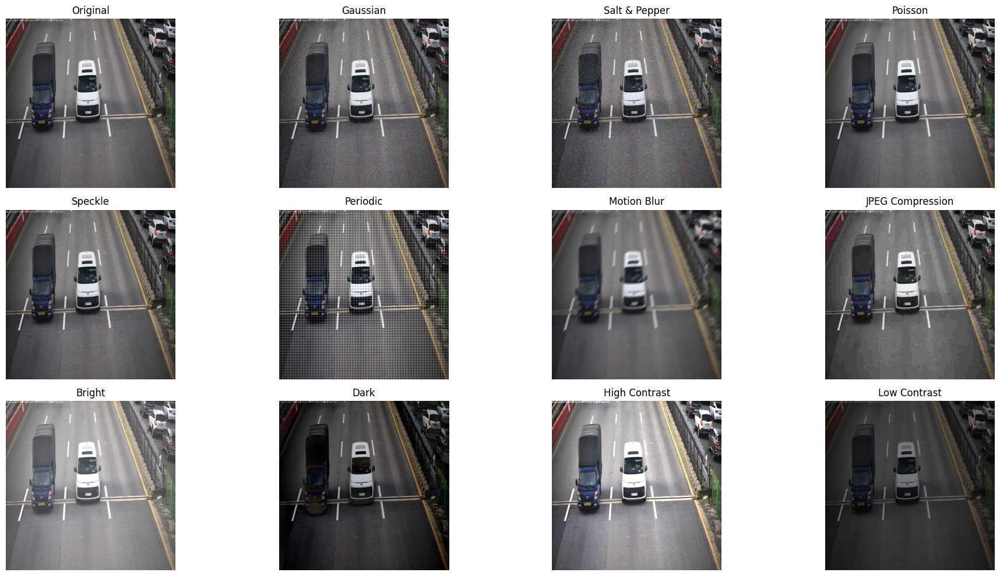

In [39]:
# 시각화
rows = 3
cols = 4  # 12개의 이미지를 3x4 그리드로 표시

plt.figure(figsize=(20, 10))

for idx, (title, noisy_img) in enumerate(noises.items()):
    plt.subplot(rows, cols, idx + 1)
    plt.imshow(noisy_img)
    plt.title(title)
    plt.axis('off')

plt.tight_layout()
plt.show()

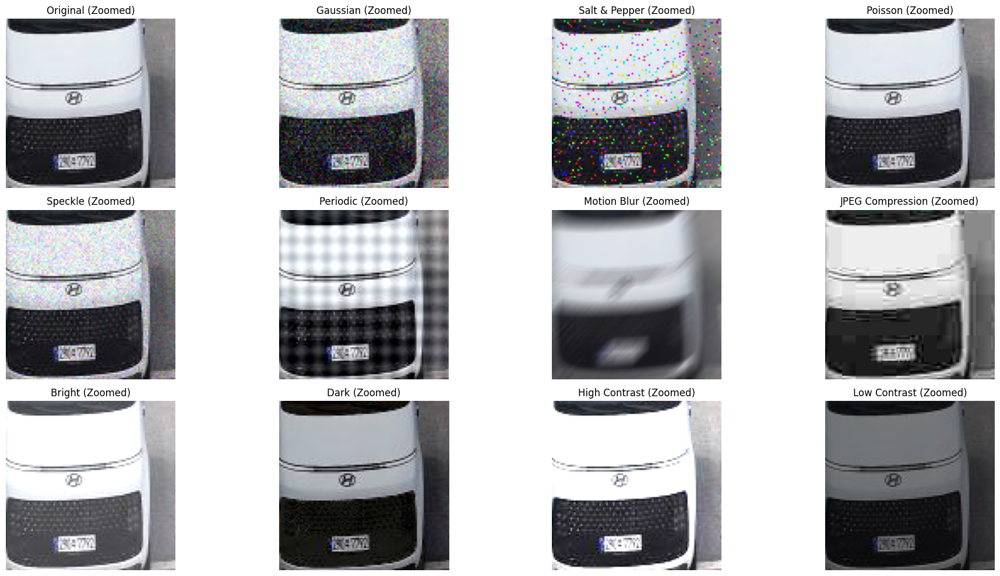

In [40]:
# 노이즈 효과를 더 자세히 보기 위해 이미지의 일부분만 확대해서 시각화
# 이미지의 중앙 부분을 크롭
h, w = img.shape[:2]
crop_size = 100
start_h = h//2 - crop_size//2
start_w = w//2 - crop_size//2

plt.figure(figsize=(20, 10))
for idx, (title, noisy_img) in enumerate(noises.items()):
    plt.subplot(rows, cols, idx + 1)
    cropped = noisy_img[start_h:start_h+crop_size, start_w:start_w+crop_size]
    plt.imshow(cropped)
    plt.title(f"{title} (Zoomed)")
    plt.axis('off')

plt.tight_layout()
plt.show()

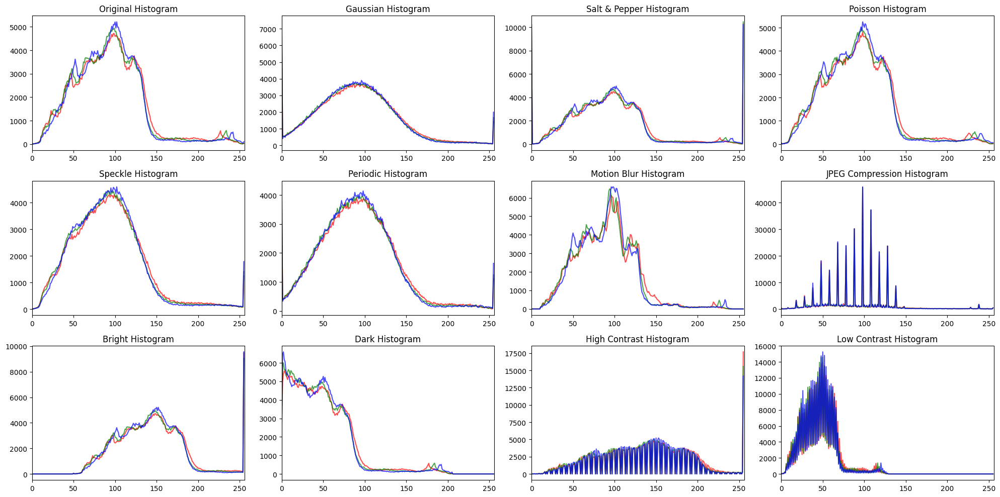

In [41]:
# 히스토그램 비교
plt.figure(figsize=(20, 10))
for idx, (title, noisy_img) in enumerate(noises.items()):
    plt.subplot(rows, cols, idx + 1)
    # RGB 각 채널의 히스토그램
    for i, color in enumerate(['r', 'g', 'b']):
        hist = cv2.calcHist([noisy_img], [i], None, [256], [0, 256])
        plt.plot(hist, color=color, alpha=0.7)
    plt.title(f"{title} Histogram")
    plt.xlim([0, 256])
    
plt.tight_layout()
plt.show()

In [42]:
# 다양한 강도의 가우시안 노이즈 테스트
noise_levels = {
    'Original': None,  # 원본 이미지
    'Very Low (σ=5)': {'mean': 0, 'sigma': 5},
    'Low (σ=15)': {'mean': 0, 'sigma': 15},
    'Medium (σ=25)': {'mean': 0, 'sigma': 25},
    'High (σ=35)': {'mean': 0, 'sigma': 35},
    'Very High (σ=50)': {'mean': 0, 'sigma': 50}
}

# 결과 이미지 저장
result_images = {}
for title, params in noise_levels.items():
    if params is None:
        result_images[title] = img
    else:
        result_images[title] = add_noise(img, 'gaussian', params)

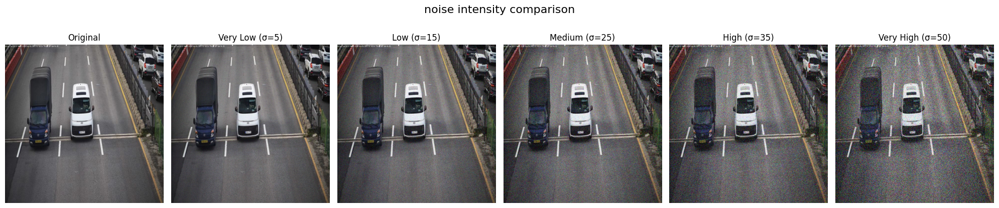

In [45]:
# 1. 전체 이미지 시각화
plt.figure(figsize=(20, 4))
for idx, (title, noisy_img) in enumerate(result_images.items()):
    plt.subplot(1, 6, idx + 1)
    plt.imshow(noisy_img)
    plt.title(title)
    plt.axis('off')
plt.suptitle('noise intensity comparison', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

/tmp/ipykernel_240248/4171600211.py:15: UserWarning: Glyph 54869 (\N{HANGUL SYLLABLE HWAG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_240248/4171600211.py:15: UserWarning: Glyph 45824 (\N{HANGUL SYLLABLE DAE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_240248/4171600211.py:15: UserWarning: Glyph 46108 (\N{HANGUL SYLLABLE DOEN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_240248/4171600211.py:15: UserWarning: Glyph 50689 (\N{HANGUL SYLLABLE YEONG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_240248/4171600211.py:15: UserWarning: Glyph 50669 (\N{HANGUL SYLLABLE YEOG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_240248/4171600211.py:15: UserWarning: Glyph 48708 (\N{HANGUL SYLLABLE BI}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_240248/4171600211.py:15: UserWarning: Glyph 44368 (\N{HANGUL SYLLABLE GYO}) missing from font(s) DejaVu S

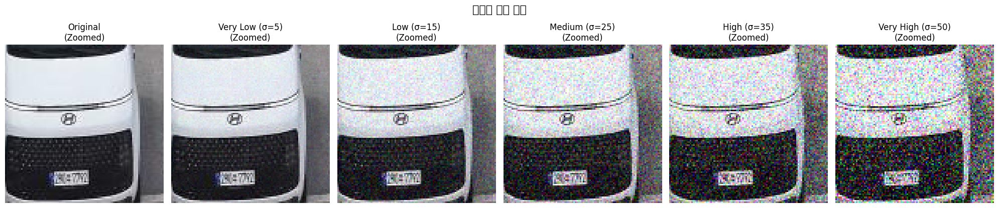

In [46]:
# 2. 확대된 부분 시각화
h, w = img.shape[:2]
crop_size = 100
start_h = h//2 - crop_size//2
start_w = w//2 - crop_size//2

plt.figure(figsize=(20, 4))
for idx, (title, noisy_img) in enumerate(result_images.items()):
    plt.subplot(1, 6, idx + 1)
    cropped = noisy_img[start_h:start_h+crop_size, start_w:start_w+crop_size]
    plt.imshow(cropped)
    plt.title(f"{title}\n(Zoomed)")
    plt.axis('off')
plt.suptitle('zoomed area comparison', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

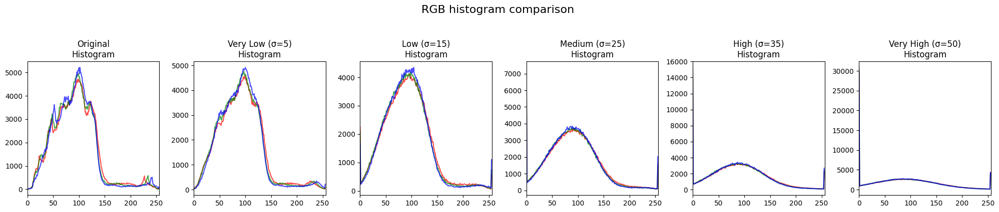

In [47]:
# 3. 히스토그램 비교
plt.figure(figsize=(20, 4))
for idx, (title, noisy_img) in enumerate(result_images.items()):
    plt.subplot(1, 6, idx + 1)
    # RGB 각 채널의 히스토그램
    for i, color in enumerate(['r', 'g', 'b']):
        hist = cv2.calcHist([noisy_img], [i], None, [256], [0, 256])
        plt.plot(hist, color=color, alpha=0.7)
    plt.title(f"{title}\nHistogram")
    plt.xlim([0, 256])
plt.suptitle('RGB histogram comparison', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

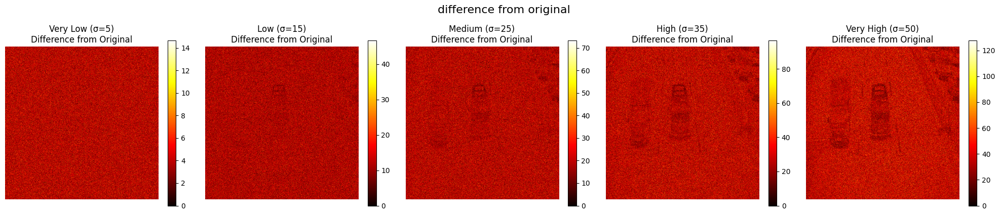

In [49]:
# 4. 픽셀값 차이 시각화 (원본과의 차이)
plt.figure(figsize=(20, 4))
original = result_images['Original']
for idx, (title, noisy_img) in enumerate(result_images.items()):
    if title == 'Original':
        continue
    plt.subplot(1, 5, idx)
    # 차이를 강조하기 위해 절대값을 취하고 스케일을 조정
    diff = np.abs(original.astype(np.float32) - noisy_img.astype(np.float32))
    diff = np.mean(diff, axis=2)  # RGB 채널의 평균
    plt.imshow(diff, cmap='hot')
    plt.colorbar()
    plt.title(f"{title}\nDifference from Original")
    plt.axis('off')
plt.suptitle('difference from original', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

### 노이즈 주입 데이터셋 생성 1
```noised_cur``` : 원본 이미지에 일정한 수준의 가우시안 노이즈 주입

In [50]:
import shutil
import tqdm

# 새로운 데이터셋 저장 경로 설정
noise_data_path = os.path.join(data_dir, "noised_cur")
noise_img_path = os.path.join(noise_data_path, "images")

# 기존 디렉토리가 있다면 삭제
if os.path.exists(noise_data_path):
    shutil.rmtree(noise_data_path)

# 디렉토리 구조 생성
os.makedirs(noise_data_path)
os.makedirs(noise_img_path)

# train과 val 디렉토리 생성
for subdir in ['train', 'val']:
    os.makedirs(os.path.join(noise_img_path, subdir))

# labels 디렉토리 복사
shutil.copytree(os.path.join(data_path, 'labels'), os.path.join(noise_data_path, 'labels'))
# dataset.yaml 파일 복사
shutil.copy2(os.path.join(data_path, 'dataset.yaml'), os.path.join(noise_data_path, 'dataset.yaml'))

# 가우시안 노이즈 파라미터 설정
noise_params = {
    'mean': 0,
    'sigma': 15  # 노이즈 강도 조절
}

# train과 val 디렉토리의 모든 이미지에 노이즈 적용
for subdir in ['train', 'val']:
    src_dir = os.path.join(img_path, subdir)
    dst_dir = os.path.join(noise_img_path, subdir)
    
    # 진행바 표시를 위한 tqdm 사용
    for img_file in tqdm.tqdm(os.listdir(src_dir), desc=f'Processing {subdir}'):
        # 이미지 로드
        img = cv2.imread(os.path.join(src_dir, img_file))
        
        # 노이즈 적용
        noisy_img = add_noise(img, 'gaussian', noise_params)
        
        # 노이즈가 적용된 이미지 저장
        cv2.imwrite(os.path.join(dst_dir, img_file), noisy_img)

print("노이즈가 적용된 데이터셋 생성 완료!")

Processing val: 100%|██████████| 2558/2558 [01:00<00:00, 42.20it/s]

노이즈가 적용된 데이터셋 생성 완료!


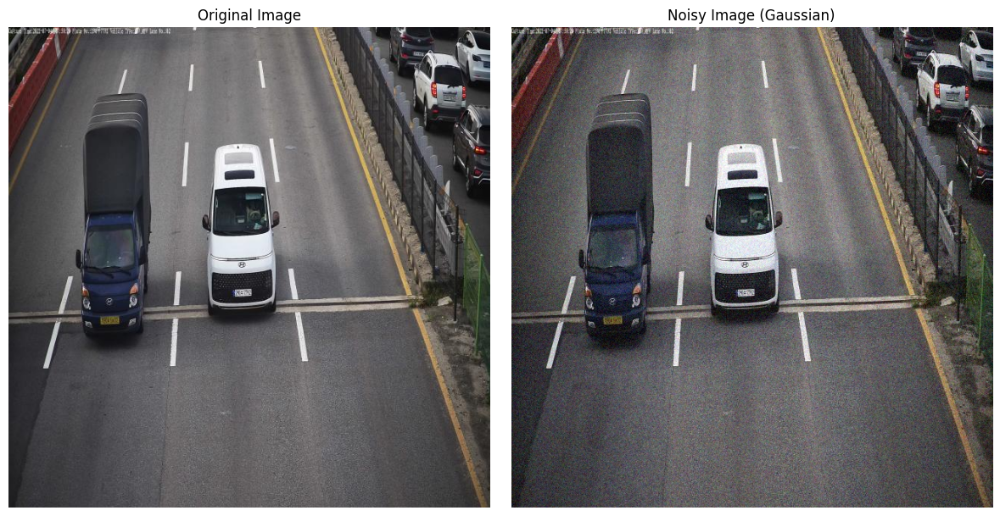

In [51]:
# 원본과 노이즈 적용 이미지 비교 시각화 (샘플)
sample_img_file = os.listdir(os.path.join(img_path, 'train'))[0]

original = cv2.imread(os.path.join(img_path, 'train', sample_img_file))
original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)

noisy = cv2.imread(os.path.join(noise_img_path, 'train', sample_img_file))
noisy = cv2.cvtColor(noisy, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(original)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(noisy)
plt.title('Noisy Image (Gaussian)')
plt.axis('off')

plt.tight_layout()
plt.show()

### 노이즈 주입 데이터셋 생성 2
```noised_test``` : 원본 이미지에 무작위 수준의 가우시안 노이즈 주입

In [52]:
import random
import json

# 데이터셋 이름 지정
dataset_name = "noised_test"

# 새로운 데이터셋 저장 경로 설정
noise_data_path = os.path.join(data_dir, dataset_name)
noise_img_path = os.path.join(noise_data_path, "images")

# 기존 디렉토리가 있다면 삭제
if os.path.exists(noise_data_path):
    shutil.rmtree(noise_data_path)

# 디렉토리 구조 생성
os.makedirs(noise_data_path)
os.makedirs(noise_img_path)

# train과 val 디렉토리 생성
for subdir in ['train', 'val']:
    os.makedirs(os.path.join(noise_img_path, subdir))

# labels 디렉토리 복사
shutil.copytree(os.path.join(data_path, 'labels'), os.path.join(noise_data_path, 'labels'))
# dataset.yaml 파일 복사
shutil.copy2(os.path.join(data_path, 'dataset.yaml'), os.path.join(noise_data_path, 'dataset.yaml'))

# 시그마값을 저장할 딕셔너리
sigma_values = {'train': {}, 'val': {}}

# train과 val 디렉토리의 모든 이미지에 노이즈 적용
for subdir in ['train', 'val']:
    src_dir = os.path.join(img_path, subdir)
    dst_dir = os.path.join(noise_img_path, subdir)
    
    # 진행바 표시를 위한 tqdm 사용
    for img_file in tqdm.tqdm(os.listdir(src_dir), desc=f'Processing {subdir}'):
        # 이미지 로드
        img = cv2.imread(os.path.join(src_dir, img_file))
        
        # 랜덤한 시그마 값 설정 (1-50)
        random_sigma = random.randint(1, 50)
        noise_params = {
            'mean': 0,
            'sigma': random_sigma
        }
        
        # 시그마값 저장
        sigma_values[subdir][img_file] = random_sigma
        
        # 노이즈 적용
        noisy_img = add_noise(img, 'gaussian', noise_params)
        
        # 노이즈가 적용된 이미지 저장
        cv2.imwrite(os.path.join(dst_dir, img_file), noisy_img)

# 시그마값을 JSON 파일로 저장
sigma_file = os.path.join(noise_data_path, 'sigma_values.json')
with open(sigma_file, 'w') as f:
    json.dump(sigma_values, f, indent=4)

print(f"랜덤 노이즈가 적용된 데이터셋 '{dataset_name}' 생성 완료!")

Processing val: 100%|██████████| 2558/2558 [01:06<00:00, 38.61it/s]

랜덤 노이즈가 적용된 데이터셋 'noised_test' 생성 완료!


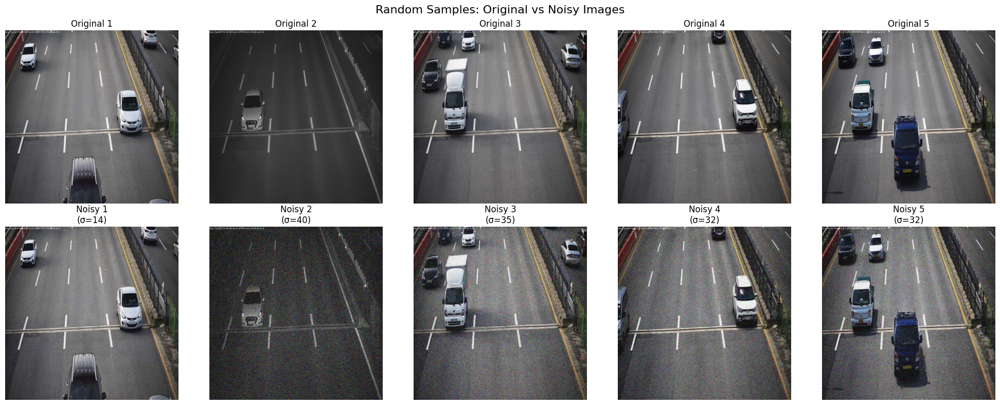

In [55]:
# 결과 확인 (여러 샘플)
n_samples = 5
train_files = os.listdir(os.path.join(img_path, 'train'))
sample_files = random.sample(train_files, n_samples)

plt.figure(figsize=(20, 8))
for idx, sample_file in enumerate(sample_files):
    # 원본 이미지
    original = cv2.imread(os.path.join(img_path, 'train', sample_file))
    original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
    
    # 노이즈가 적용된 이미지
    noisy = cv2.imread(os.path.join(noise_img_path, 'train', sample_file))
    noisy = cv2.cvtColor(noisy, cv2.COLOR_BGR2RGB)
    # 해당 이미지의 시그마값 가져오기
    sigma = sigma_values['train'][sample_file]

    # 원본 이미지 표시
    plt.subplot(2, n_samples, idx + 1)
    plt.imshow(original)
    plt.title(f'Original {idx+1}')
    plt.axis('off')
    
    # 노이즈 적용된 이미지 표시
    plt.subplot(2, n_samples, n_samples + idx + 1)
    plt.imshow(noisy)
    plt.title(f'Noisy {idx+1}\n(σ={sigma})')
    plt.axis('off')

plt.suptitle('Random Samples: Original vs Noisy Images', fontsize=16)
plt.tight_layout()
plt.show()

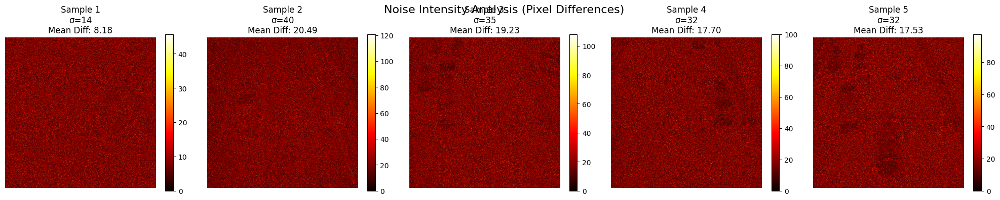

In [56]:
# 픽셀값 차이 분석
plt.figure(figsize=(20, 4))
for idx, sample_file in enumerate(sample_files):
    # 원본과 노이즈 이미지 로드
    original = cv2.imread(os.path.join(img_path, 'train', sample_file))
    noisy = cv2.imread(os.path.join(noise_img_path, 'train', sample_file))
    
    # 픽셀값 차이 계산
    diff = np.abs(original.astype(np.float32) - noisy.astype(np.float32))  # 절대값 차이
    diff_mean = np.mean(diff)  # 평균 차이
    
    # 해당 이미지의 시그마값 가져오기
    sigma = sigma_values['train'][sample_file]
    
    # 차이 시각화
    plt.subplot(1, n_samples, idx + 1)
    plt.imshow(diff.mean(axis=2), cmap='hot')  # RGB 채널의 평균 차이를 히트맵으로 표시
    plt.colorbar()
    plt.title(f'Sample {idx+1}\nσ={sigma}\nMean Diff: {diff_mean:.2f}')
    plt.axis('off')

plt.suptitle('Noise Intensity Analysis (Pixel Differences)', fontsize=16)
plt.tight_layout()
plt.show()

## 드리프트 분석
evidently 라이브러리를 활용한 데이터 드리프트 분석 결과 시각화
>identical visualize projection & vector encoding